In [1]:
!pip install albumentations

In [2]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import zipfile
import random
import albumentations
import subprocess
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications.resnet_v2 import preprocess_input as resnet_preprocess_input
from tensorflow.keras.applications.inception_v3 import preprocess_input as inceptionv3_preprocess_input
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenetv2_preprocess_input
from tensorflow.keras.models import load_model
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from joblib import dump
from IPython.display import FileLink, display
from PIL import Image

In [3]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
image_folder_path = '/content/drive/MyDrive/train'
filenames = os.listdir(image_folder_path)

In [5]:
sns.set(rc={'axes.facecolor': 'gainsboro'}, style='darkgrid')

In [6]:
images = []
for filename in filenames:
    if filename.endswith('.jpg') or filename.endswith('.png'):
        img_path = os.path.join(image_folder_path, filename)
        img = Image.open(img_path)
        images.append(img)

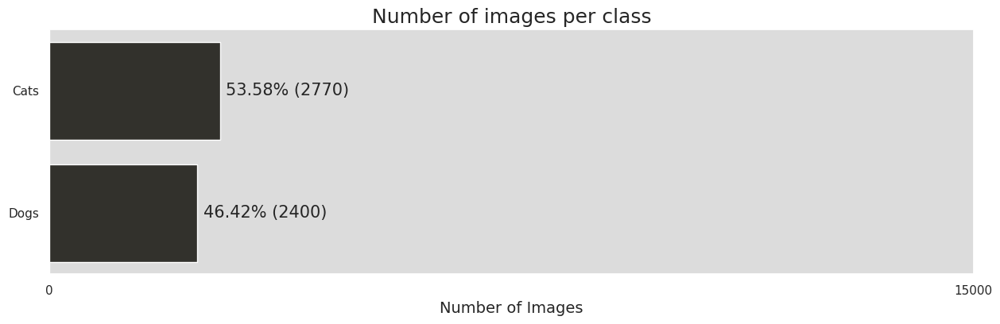

In [7]:
cat_images = [filename for filename in filenames if "cat" in filename]
dog_images = [filename for filename in filenames if "dog" in filename]

cat_count = len(cat_images)
dog_count = len(dog_images)

total_images = cat_count + dog_count
cat_percentage = (cat_count / total_images) * 100
dog_percentage = (dog_count / total_images) * 100

labels = ['Cats', 'Dogs']
counts = [cat_count, dog_count]
percentages = [cat_percentage, dog_percentage]

plt.figure(figsize=(15, 4))

ax = sns.barplot(y=labels, x=counts, orient='h', color='#33312b')

ax.set_xticks([0, 15000])

for i, p in enumerate(ax.patches):
    width = p.get_width()
    ax.text(width + 100, p.get_y() + p.get_height()/2.,
            '{:1.2f}% ({})'.format(percentages[i], counts[i]),
            va="center", fontsize=15)

plt.xlabel('Number of Images', fontsize=14)

plt.title("Number of images per class", fontsize=18)
plt.show()

In [8]:
heights = []
widths = []

unique_dims = set()
unique_channels = set()

for filename in filenames:
    img = cv2.imread(os.path.join(image_folder_path, filename))
    if img is not None:
        unique_dims.add((img.shape[0], img.shape[1]))

        unique_channels.add(img.shape[2])

        heights.append(img.shape[0])
        widths.append(img.shape[1])

if len(unique_dims) == 1:
    print(f"All images have the same dimensions: {list(unique_dims)[0]}")
else:
    print(f"There are {len(unique_dims)} different image dimensions in the dataset.")
    print(f"Min height: {min(heights)}, Max height: {max(heights)}, Mean height: {np.mean(heights):.2f}")
    print(f"Min width: {min(widths)}, Max width: {max(widths)}, Mean width: {np.mean(widths):.2f}")

if len(unique_channels) == 1:
    channel = list(unique_channels)[0]
    if channel == 3:
        print("All images are color images.")
    else:
        print("All images have the same number of channels, but they are not color images.")
else:
    print("Images have different numbers of channels.")

There are 2467 different image dimensions in the dataset.
Min height: 39, Max height: 500, Mean height: 362.94
Min width: 50, Max width: 500, Mean width: 406.18
All images are color images.


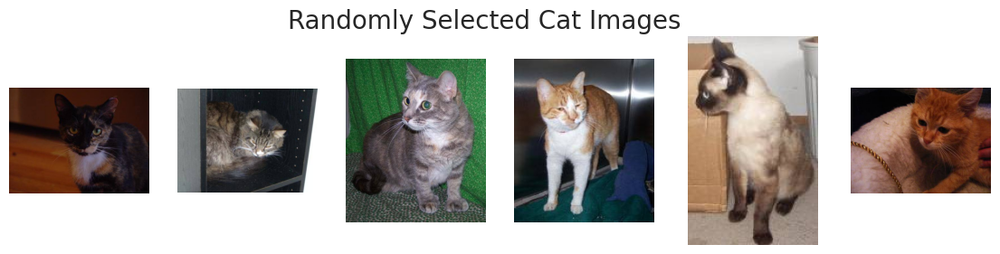

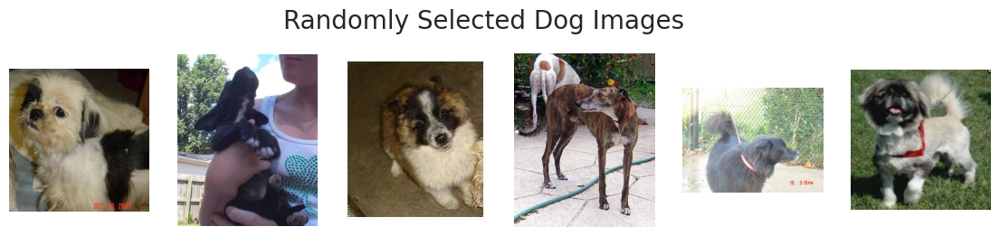

In [9]:
np.random.seed(42)

random_cat_images = np.random.choice(cat_images, 6)
random_dog_images = np.random.choice(dog_images, 6)

def plot_images(images, title):
    plt.figure(figsize=(14, 3))
    for i, img_name in enumerate(images):
        plt.subplot(1, 6, i+1)
        img = cv2.imread(os.path.join(image_folder_path, img_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(title, fontsize=20)
    plt.show()

plot_images(random_cat_images, "Randomly Selected Cat Images")
plot_images(random_dog_images, "Randomly Selected Dog Images")

In [10]:
del filenames, heights, widths, unique_dims, unique_channels

In [11]:
data = []

data.extend([(os.path.join(image_folder_path, filename), "cat") for filename in cat_images])

data.extend([(os.path.join(image_folder_path, filename), "dog") for filename in dog_images])

df = pd.DataFrame(data, columns=['filepath', 'label'])

df.head()
del data, cat_images, dog_images

In [12]:
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

print("Training data shape:", train_df.shape)
print("Validation data shape:", val_df.shape)

del df
train_df.head()

Training data shape: (4136, 2)
Validation data shape: (1034, 2)


,filepath,label
2915,/content/drive/MyDrive/train/dog.9219.jpg,dog
1490,/content/drive/MyDrive/train/cat.1185.jpg,cat
3214,/content/drive/MyDrive/train/dog.9499.jpg,dog
4583,/content/drive/MyDrive/train/dog.8930.jpg,dog
309,/content/drive/MyDrive/train/cat.12215.jpg,cat


In [13]:
def add_rain(image,
             slant_lower=-10,
             slant_upper=10,
             drop_length=20,
             drop_width=1,
             drop_color=(200, 200, 200),
             blur_value=3,
             brightness_coefficient=0.9,
             rain_type=None):

    """Add rain effect to the input image using specified parameters."""

    rain_aug = albumentations.RandomRain(
                                         slant_lower=slant_lower,
                                         slant_upper=slant_upper,
                                         drop_length=drop_length,
                                         drop_width=drop_width,
                                         drop_color=drop_color,
                                         blur_value=blur_value,
                                         brightness_coefficient=brightness_coefficient,
                                         rain_type=rain_type,
                                         p=1
    )

    augmented = rain_aug(image=image)

    return augmented['image']

In [14]:
def add_snow(image,
             snow_point_lower=0.1,
             snow_point_upper=0.2,
             brightness_coeff=2.0):

    """Add snow effect to the input image using specified parameters."""

    snow_aug = albumentations.RandomSnow(snow_point_lower=snow_point_lower,
                                         snow_point_upper=snow_point_upper,
                                         brightness_coeff=brightness_coeff,
                                         p=1
                                         )

    augmented = snow_aug(image=image)

    return augmented['image']

In [15]:
def add_fog(image,
            fog_coef_lower=0.3,
            fog_coef_upper=1,
            alpha_coef=0.08):

    """Add fog effect to the input image using specified parameters."""

    fog_aug = albumentations.RandomFog(fog_coef_lower=fog_coef_lower,
                                       fog_coef_upper=fog_coef_upper,
                                       alpha_coef=alpha_coef,
                                       p=1
                                       )

    augmented = fog_aug(image=image)

    return augmented['image']

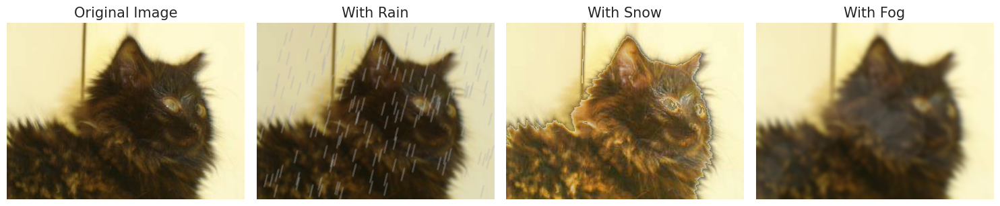

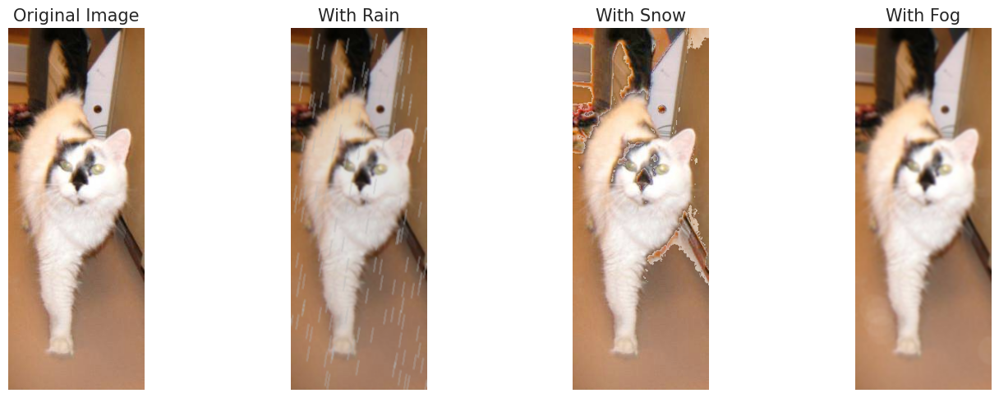

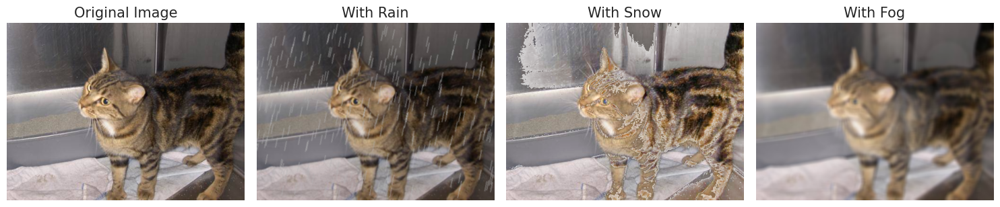

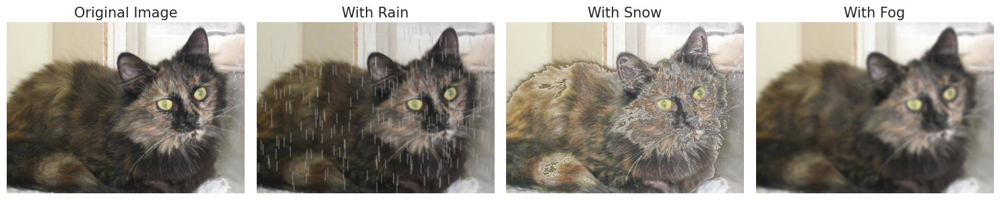

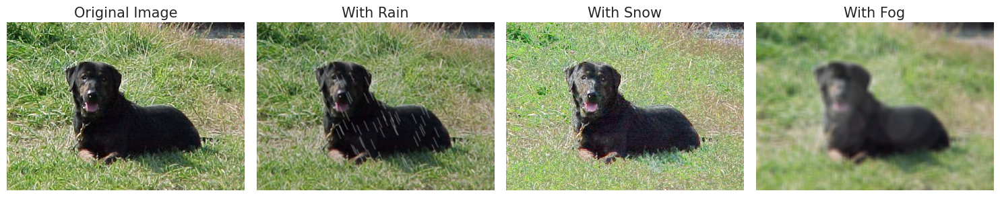

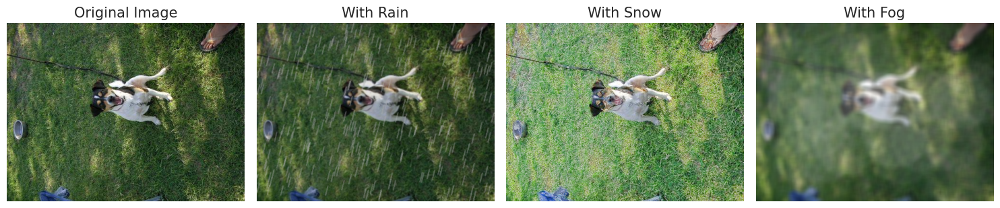

In [16]:
np.random.seed(42)

random_image_paths = random.sample(train_df['filepath'].tolist(), 6)

for image_path in random_image_paths:
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_rain = add_rain(image)
    image_snow = add_snow(image)
    image_fog = add_fog(image)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))

    axes[0].imshow(image)
    axes[0].set_title("Original Image", fontsize=15)
    axes[0].axis("off")

    axes[1].imshow(image_rain)
    axes[1].set_title("With Rain", fontsize=15)
    axes[1].axis("off")

    axes[2].imshow(image_snow)
    axes[2].set_title("With Snow", fontsize=15)
    axes[2].axis("off")

    axes[3].imshow(image_fog)
    axes[3].set_title("With Fog", fontsize=15)
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()

In [17]:
def create_data_generators(preprocessing_function=None, batch_size=32, image_dimensions=(224, 224)):

    train_datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.15,
        height_shift_range=0.15,
        zoom_range=0.15,
        horizontal_flip=True,
        vertical_flip=False,
        shear_range=0.02,
        preprocessing_function=preprocessing_function
    )

    val_datagen = ImageDataGenerator(
        preprocessing_function=preprocessing_function  #
    )

    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        x_col="filepath",
        y_col="label",
        target_size=image_dimensions,
        batch_size=batch_size,
        class_mode='binary',
        seed=42,
        shuffle=True
    )

    val_generator = val_datagen.flow_from_dataframe(
        dataframe=val_df,
        x_col="filepath",
        y_col="label",
        target_size=image_dimensions,
        batch_size=batch_size,
        class_mode='binary',
        seed=42,
        shuffle=False
    )

    return train_generator, val_generator

In [18]:
resnet50v2_base = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
resnet50v2_base.summary()

94668760/94668760 [==============================] - 3s 0us/step
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                        

In [19]:
resnet50v2_base.trainable = False

In [20]:
x = resnet50v2_base.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)

resnet50v2_model = Model(inputs=resnet50v2_base.input, outputs=predictions)

resnet50v2_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

In [21]:
plot_model(
    resnet50v2_model,
    show_shapes=True,
    show_layer_names=False,
    dpi=150
)

In [22]:
resnet50v2_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                              

In [23]:
mobilenetv2_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
mobilenetv2_base.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReL

In [24]:
mobilenetv2_base.trainable = False

In [25]:
x = mobilenetv2_base.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)

mobilenetv2_nn_model = Model(inputs=mobilenetv2_base.input, outputs=predictions)

mobilenetv2_nn_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

mobilenetv2_nn_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

In [26]:
gap = GlobalAveragePooling2D()(mobilenetv2_base.output)

mobilenetv2_feature_extractor = Model(inputs=mobilenetv2_base.input, outputs=gap)

In [27]:
output_shape = mobilenetv2_feature_extractor.output_shape
print("Output shape of feature extractor model:", output_shape)

Output shape of feature extractor model: (None, 1280)


In [28]:
def train_model(model, preprocessing_function, image_dimensions=(224, 224), batch_size=32, num_epochs=20):

    train_generator, val_generator = create_data_generators(preprocessing_function, batch_size, image_dimensions)

    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0.00001)
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True, verbose=1)

    history = model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        epochs=num_epochs,
        validation_data=val_generator,
        validation_steps=len(val_generator),
        callbacks=[reduce_lr, early_stopping]
    )

    return model, history, val_generator

In [ ]:
resnet50v2_model, resnet50v2_history, resnet50v2_val_generator = train_model(
    resnet50v2_model,
    preprocessing_function=resnet_preprocess_input,
    image_dimensions=(224, 224),
    batch_size=32,
    num_epochs=10
)

Found 4136 validated image filenames belonging to 2 classes.
Found 1034 validated image filenames belonging to 2 classes.
Epoch 1/10
130/130 [==============================] - 1161s 9s/step - loss: 0.0994 - accuracy: 0.9599 - val_loss: 0.0431 - val_accuracy: 0.9836 - lr: 1.0000e-04
Epoch 2/10
130/130 [==============================] - 976s 8s/step - loss: 0.0494 - accuracy: 0.9824 - val_loss: 0.0370 - val_accuracy: 0.9884 - lr: 1.0000e-04
Epoch 3/10
130/130 [==============================] - 986s 8s/step - loss: 0.0472 - accuracy: 0.9824 - val_loss: 0.0334 - val_accuracy: 0.9884 - lr: 1.0000e-04
Epoch 4/10
130/130 [==============================] - 966s 7s/step - loss: 0.0387 - accuracy: 0.9850 - val_loss: 0.0329 - val_accuracy: 0.9865 - lr: 1.0000e-04
Epoch 5/10
130/130 [==============================] - 971s 7s/step - loss: 0.0389 - accuracy: 0.9860 - val_loss: 0.0308 - val_accuracy: 0.9903 - lr: 1.0000e-04
Epoch 6/10
130/130 [==============================] - 987s 8s/step - loss: 0.

In [ ]:
mobilenetv2_nn_model, mobilenetv2_nn_history, mobilenetv2_nn_val_generator = train_model(
    mobilenetv2_nn_model,
    preprocessing_function=mobilenetv2_preprocess_input,
    image_dimensions=(224, 224),
    batch_size=32,
    num_epochs=10
)

Found 4136 validated image filenames belonging to 2 classes.
Found 1034 validated image filenames belonging to 2 classes.
Epoch 1/10
130/130 [==============================] - 332s 3s/step - loss: 0.0671 - accuracy: 0.9758 - val_loss: 0.0501 - val_accuracy: 0.9855 - lr: 1.0000e-04
Epoch 2/10
130/130 [==============================] - 308s 2s/step - loss: 0.0568 - accuracy: 0.9794 - val_loss: 0.0426 - val_accuracy: 0.9874 - lr: 1.0000e-04
Epoch 3/10
130/130 [==============================] - 308s 2s/step - loss: 0.0550 - accuracy: 0.9787 - val_loss: 0.0398 - val_accuracy: 0.9874 - lr: 1.0000e-04
Epoch 4/10
130/130 [==============================] - 310s 2s/step - loss: 0.0578 - accuracy: 0.9780 - val_loss: 0.0402 - val_accuracy: 0.9884 - lr: 1.0000e-04
Epoch 5/10
130/130 [==============================] - 309s 2s/step - loss: 0.0511 - accuracy: 0.9799 - val_loss: 0.0419 - val_accuracy: 0.9874 - lr: 1.0000e-04
Epoch 6/10
130/130 [==============================] - 308s 2s/step - loss: 0.0

In [29]:
def create_feature_extraction_generator(preprocessing_function, dataframe, x_col, y_col, batch_size=32, image_dimensions=(224, 224)):

    datagen = ImageDataGenerator(preprocessing_function=preprocessing_function)

    generator = datagen.flow_from_dataframe(
        dataframe=dataframe,
        x_col=x_col,
        y_col=y_col,
        target_size=image_dimensions,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )

    return generator

In [30]:
def extract_features(model, generator):

    features = model.predict(generator, steps=len(generator), verbose=1)

    labels = generator.classes

    return features, labels

In [31]:
def reduce_dimensionality(features, n_components=0.90, fit_pca=None):

    if fit_pca is None:
        pca = PCA(n_components=n_components)
        reduced_features = pca.fit_transform(features)
        print(f'Cumulative explained variance by {pca.n_components_} principal components: {np.sum(pca.explained_variance_ratio_):.2f}')
        return reduced_features, pca
    else:
        reduced_features = fit_pca.transform(features)
        return reduced_features

In [32]:
def train_svm(features, labels):

    svm = SVC(kernel='linear')

    svm.fit(features, labels)

    return svm

In [ ]:
train_generator = create_feature_extraction_generator(mobilenetv2_preprocess_input, train_df, "filepath", "label", 32, (224, 224))
val_generator = create_feature_extraction_generator(mobilenetv2_preprocess_input, val_df, "filepath", "label", 32, (224, 224))

train_features, train_labels = extract_features(mobilenetv2_feature_extractor, train_generator)
val_features, val_labels = extract_features(mobilenetv2_feature_extractor, val_generator)

train_features_reduced, pca = reduce_dimensionality(train_features, n_components=0.90)

val_features_reduced = reduce_dimensionality(val_features, fit_pca=pca)

svm_model = train_svm(train_features_reduced, train_labels)

val_predictions = svm_model.predict(val_features_reduced)

svm_validation_accuracy = accuracy_score(val_labels, val_predictions)
print(f"SVM Classifier Validation Accuracy: {svm_validation_accuracy * 100:.2f}%")

Found 4136 validated image filenames belonging to 2 classes.
Found 1034 validated image filenames belonging to 2 classes.
33/33 [==============================] - 50s 2s/step
Cumulative explained variance by 460 principal components: 0.90
SVM Classifier Validation Accuracy: 98.55%


In [33]:
def plot_learning_curves(history, title='Model Learning Curves'):
    df = pd.DataFrame(history.history)

    sns.set(rc={'axes.facecolor': 'gainsboro'}, style='darkgrid')

    plt.figure(figsize=(15,6))
    plt.suptitle(title, fontsize=16)

    plt.subplot(1, 2, 1)
    sns.lineplot(x=df.index, y=df['loss'], color='royalblue', label='Train Loss', marker='o', linestyle='--')
    sns.lineplot(x=df.index, y=df['val_loss'], color='orangered', label='Validation Loss', marker='o', linestyle='--')
    plt.title('Loss Evolution')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.subplot(1, 2, 2)
    sns.lineplot(x=df.index, y=df['accuracy'], color='royalblue', label='Train Accuracy', marker='o', linestyle='--')
    sns.lineplot(x=df.index, y=df['val_accuracy'], color='orangered', label='Validation Accuracy', marker='o', linestyle='--')
    plt.title('Accuracy Evolution')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    plt.show()

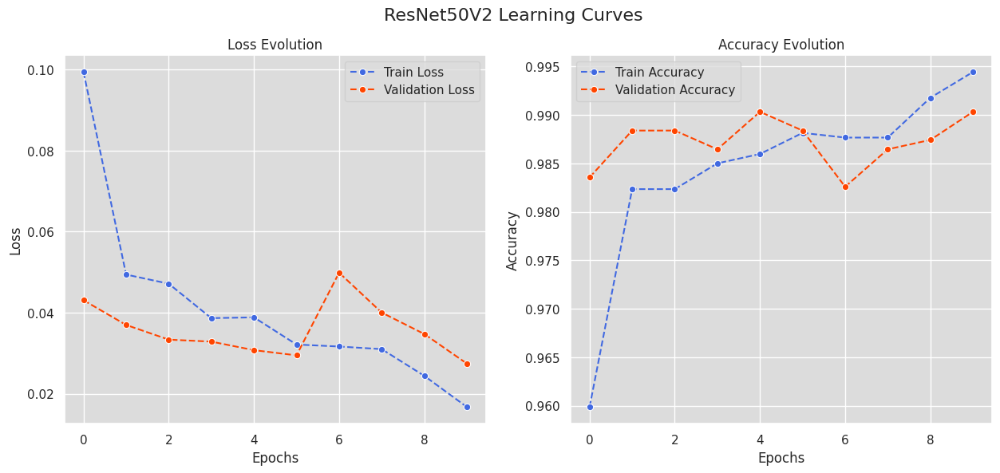

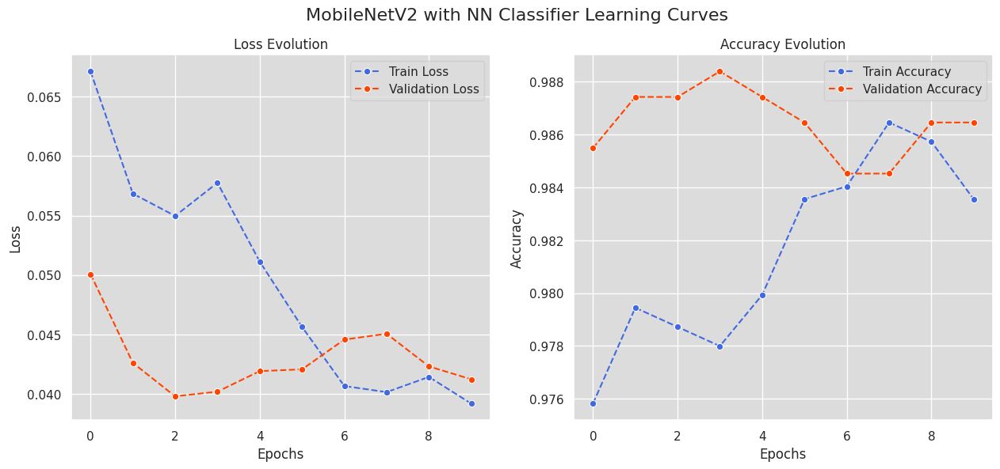

In [ ]:
plot_learning_curves(resnet50v2_history, title='ResNet50V2 Learning Curves')
plot_learning_curves(mobilenetv2_nn_history, title='MobileNetV2 with NN Classifier Learning Curves')

In [ ]:
print(resnet50v2_history.history.keys())
print(mobilenetv2_nn_history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


In [34]:
def calculate_accuracy(model, val_generator):
    results = model.evaluate(val_generator, steps=len(val_generator))
    accuracy = results[1]
    return accuracy

In [ ]:
resnet50v2_accuracy = calculate_accuracy(resnet50v2_model, resnet50v2_val_generator)
mobilenetv2_nn_accuracy = calculate_accuracy(mobilenetv2_nn_model, mobilenetv2_nn_val_generator)

33/33 [==============================] - 52s 2s/step - loss: 0.0412 - accuracy: 0.9865


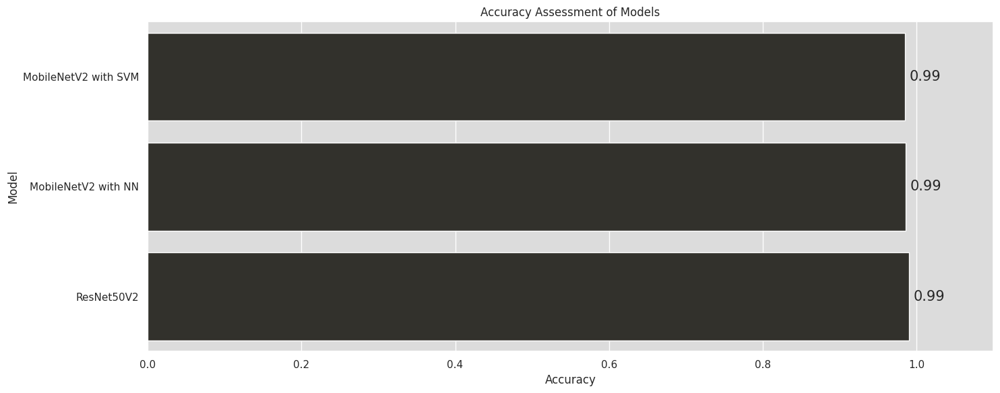

In [ ]:
accuracies = {
    'MobileNetV2 with SVM': svm_validation_accuracy,
    'ResNet50V2': resnet50v2_accuracy,
    'MobileNetV2 with NN': mobilenetv2_nn_accuracy
}

accuracy_df = pd.DataFrame(list(accuracies.items()), columns=['Model', 'Accuracy'])

accuracy_df.sort_values('Accuracy', ascending=True, inplace=True)

plt.figure(figsize=(15, 6))
bar_plot = sns.barplot(x='Accuracy', y='Model', data=accuracy_df, color='#33312b', orient='h')

for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_width(), '.2f'),
                      (p.get_width()+0.02, p.get_y() + p.get_height() / 2),
                      ha='center', va='center',
                      xytext=(5, 0), textcoords='offset points', fontsize=15)

plt.xlabel('Accuracy')
plt.title('Accuracy Assessment of Models')
plt.xlim(0, 1.1)
plt.tight_layout()
plt.show()

In [ ]:
mobilenetv2_feature_extractor.save('mobilenetv2_feature_extractor.h5')

dump(pca, 'pca_transformer.joblib')

dump(svm_model, 'svm_classifier.joblib')

['svm_classifier.joblib']

In [ ]:
mobilenetv2_nn_model.save('mobilenetv2_nn_model.h5')

In [35]:
def get_file_size(file_path):
    return os.path.getsize(file_path) / (1024 * 1024)

In [ ]:
size_feature_extractor = get_file_size('mobilenetv2_feature_extractor.h5')
size_pca = get_file_size('pca_transformer.joblib')
size_svm = get_file_size('svm_classifier.joblib')
size_mobilenetv2_nn = get_file_size('mobilenetv2_nn_model.h5')

total_size_svm = size_feature_extractor + size_pca + size_svm

total_model_sizes = {
    'MobileNetV2_SVM_Total': total_size_svm,
    'MobileNetV2_NN': size_mobilenetv2_nn
}

total_model_size_df = pd.DataFrame(list(total_model_sizes.items()), columns=['Model', 'Size'])

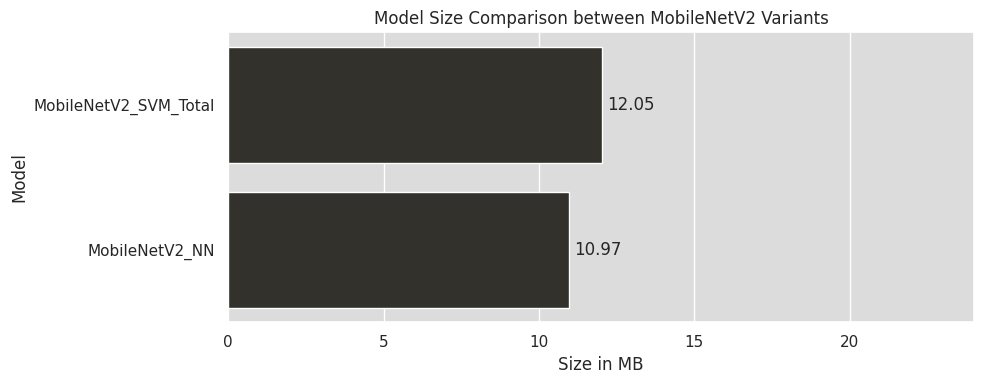

In [ ]:
plt.figure(figsize=(10, 4))
bar_plot = sns.barplot(x='Size', y='Model', data=total_model_size_df, color='#33312b', orient='h')

for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_width(), '.2f'),
                      (p.get_width()+0.7, p.get_y() + p.get_height() / 2),
                      ha='center', va='center',
                      xytext=(5, 0), textcoords='offset points')

plt.xlabel('Size in MB')
plt.title('Model Size Comparison between MobileNetV2 Variants')
plt.xlim(0, 24)
plt.tight_layout()
plt.show()

In [36]:
def download_all_models(files, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"

    command = f"zip {zip_name} " + " ".join(files)

    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return

    display(FileLink(f'{download_file_name}.zip'))

In [ ]:
model_files = ['mobilenetv2_nn_model.h5']